### This is the first project that i did for resume generation. I read the topic wrong and did it a little wrong, but this is a better project and has a very large dataset to work witgh as well

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import string
import nltk
from nltk.corpus import stopwords
from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from wordcloud import WordCloud

import matplotlib.pyplot as plt
%matplotlib inline
from textblob import Word
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


In [ ]:
test = pd.read_csv('/content/drive/MyDrive/AAI/train.csv')
test = test.dropna()
print("\n ** raw data **\n")
print(test.head())
print("\n ** data shape **\n")
print(test.shape)


 ** raw data **

   id     Experience Qualifications Salary Range    location  \
0   1  5 to 15 Years         M.Tech    $59K-$99K     Douglas   
1   2  2 to 12 Years            BCA   $56K-$116K    Ashgabat   
2   3  0 to 12 Years            PhD   $61K-$104K       Macao   
3   4  4 to 11 Years            PhD    $65K-$91K  Porto-Novo   
4   5  1 to 12 Years            MBA    $64K-$87K    Santiago   

            Country  latitude  longitude  Work Type  Company Size  ...  \
0       Isle of Man   54.2361    -4.5481     Intern         26801  ...   
1      Turkmenistan   38.9697    59.5563     Intern        100340  ...   
2  Macao SAR, China   22.1987   113.5439  Temporary         84525  ...   
3             Benin    9.3077     2.3158  Full-Time        129896  ...   
4             Chile  -35.6751   -71.5429     Intern         53944  ...   

                 Contact                     Job_Title  \
0   001-381-930-7517x737  Digital Marketing Specialist   
1           461-509-4216            

In [ ]:
fig = plt.figure(figsize=(300, 10), dpi=200, facecolor='w', edgecolor='k')
test.Job_Title.hist(bins=len(test.Job_Title.unique()))  # Set number of bins to the number of unique job titles
plt.show()
print(len(test.Job_Title.unique()))

147


In [ ]:
import nltk
nltk.download('stopwords')

from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
import nltk
nltk.download('wordnet')

from nltk.corpus import wordnet

[nltk_data] Downloading package wordnet to /root/nltk_data...


In [ ]:
## Lower case
test['skills'] = test['skills'].apply(lambda x: " ".join(x.lower()for x in x.split()))
## remove tabulation and punctuation
test['skills'] = test['skills'].str.replace('[^\w\s]',' ')
## digits
test['skills'] = test['skills'].str.replace('\d+', '')

#remove stop words
stop = stopwords.words('english')
test['skills'] = test['skills'].apply(lambda x: " ".join(x for x in x.split() if x not in stop))

## lemmatization
test['skills'] = test['skills'].apply(lambda x: " ".join([Word(word).lemmatize() for word in x.split()]))

print("Preprocessed data: \n")
print(test.head())

Preprocessed data: 

   id     Experience Qualifications Salary Range    location  \
0   1  5 to 15 Years         M.Tech    $59K-$99K     Douglas   
1   2  2 to 12 Years            BCA   $56K-$116K    Ashgabat   
2   3  0 to 12 Years            PhD   $61K-$104K       Macao   
3   4  4 to 11 Years            PhD    $65K-$91K  Porto-Novo   
4   5  1 to 12 Years            MBA    $64K-$87K    Santiago   

            Country  latitude  longitude  Work Type  Company Size  ...  \
0       Isle of Man   54.2361    -4.5481     Intern         26801  ...   
1      Turkmenistan   38.9697    59.5563     Intern        100340  ...   
2  Macao SAR, China   22.1987   113.5439  Temporary         84525  ...   
3             Benin    9.3077     2.3158  Full-Time        129896  ...   
4             Chile  -35.6751   -71.5429     Intern         53944  ...   

                 Contact                     Job_Title  \
0   001-381-930-7517x737  Digital Marketing Specialist   
1           461-509-4216         

In [ ]:
## jda stands for job description aggregated
jda = test.groupby(['Job_Title']).sum().reset_index()
print("Aggregated job descriptions: \n")
print(jda)

Aggregated job descriptions: 

                    Job_Title     id  \
0            Account Director   5884   
1           Account Executive  12052   
2             Account Manager  20960   
3                  Accountant   9781   
4    Administrative Assistant  19678   
..                        ...    ...   
142             Urban Planner  14473   
143              Veterinarian  21234   
144              Web Designer   8043   
145             Web Developer  14916   
146           Wedding Planner   8790   

                                            Experience  \
0    1 to 8 Years4 to 9 Years3 to 14 Years5 to 12 Y...   
1    5 to 14 Years5 to 12 Years0 to 14 Years1 to 9 ...   
2    1 to 9 Years4 to 11 Years5 to 8 Years1 to 10 Y...   
3    1 to 8 Years5 to 12 Years1 to 10 Years1 to 10 ...   
4    4 to 9 Years5 to 9 Years0 to 10 Years5 to 8 Ye...   
..                                                 ...   
142  5 to 10 Years1 to 8 Years1 to 8 Years1 to 14 Y...   
143  1 to 15 Years1 to 1


*** Account Director ***



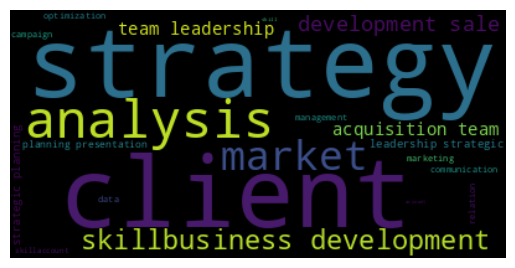


*** Account Executive ***



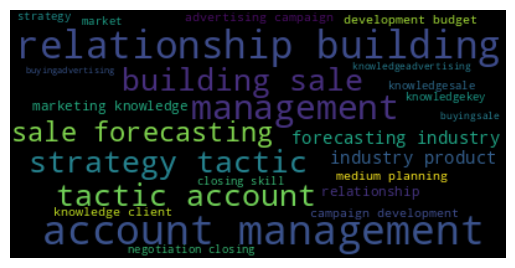


*** Account Manager ***



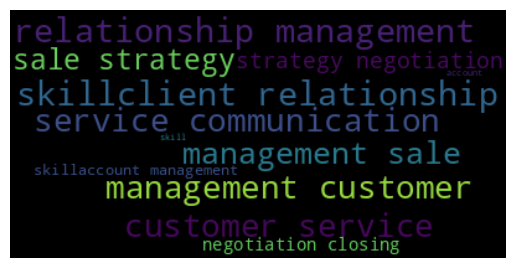


*** Accountant ***



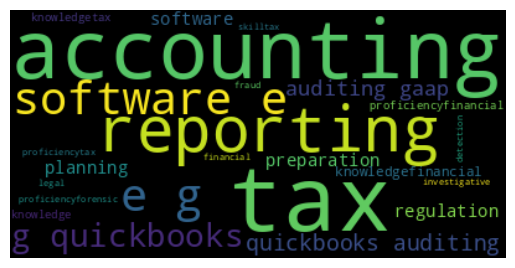


*** Administrative Assistant ***



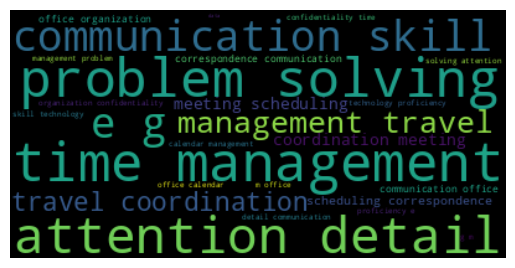


*** Aerospace Engineer ***



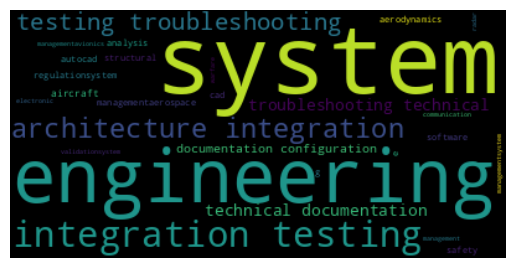


*** Architect ***



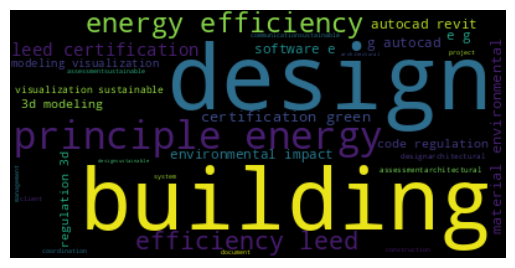


*** Architectural Designer ***



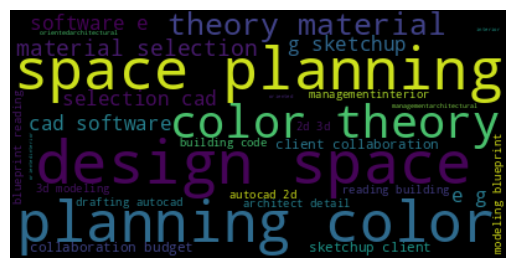


*** Art Director ***



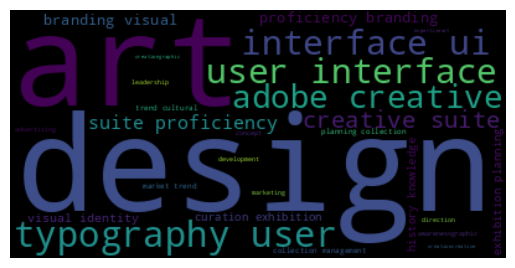


*** Art Teacher ***



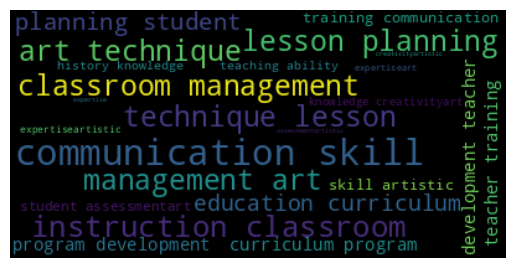


*** Back-End Developer ***



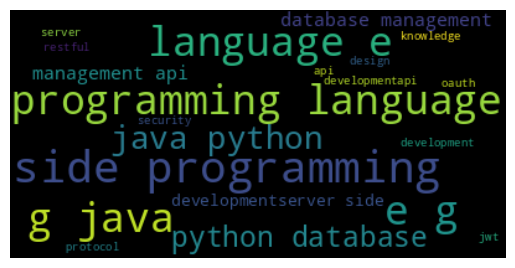


*** Brand Ambassador ***



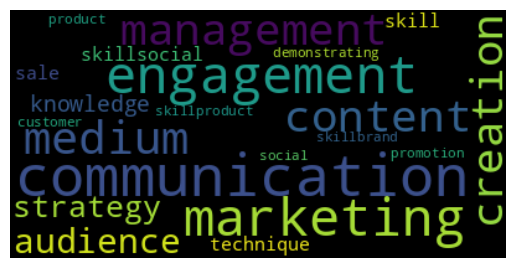


*** Brand Manager ***



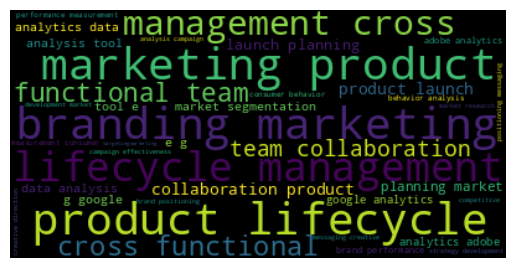


*** Business Analyst ***



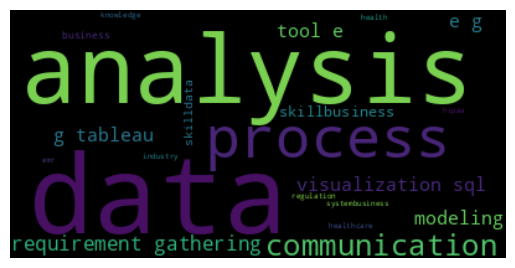


*** Business Development Manager ***



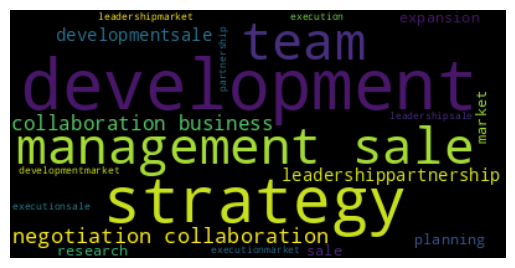


*** Chemical Analyst ***



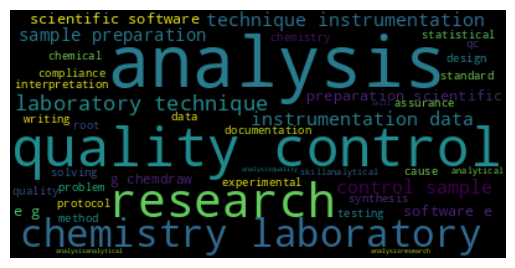


*** Chemical Engineer ***



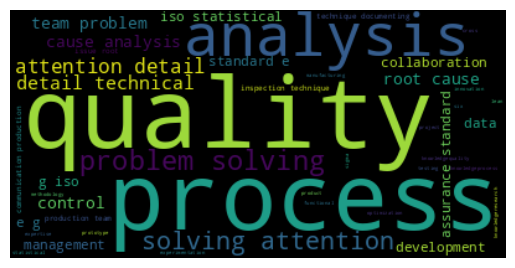


*** Civil Engineer ***



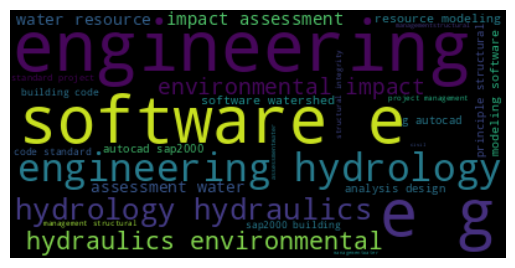


*** Content Writer ***



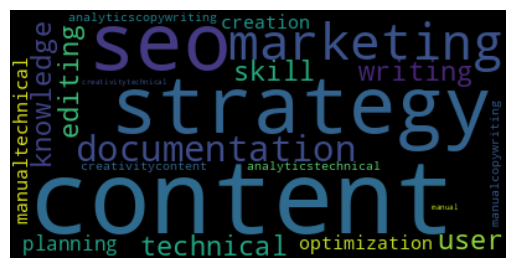


*** Copywriter ***



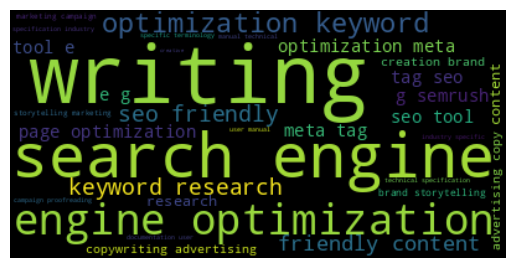


*** Customer Service Manager ***



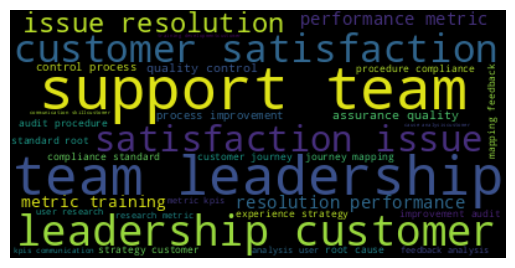


*** Customer Service Representative ***



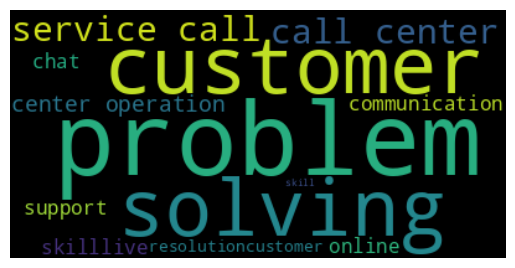


*** Customer Success Manager ***



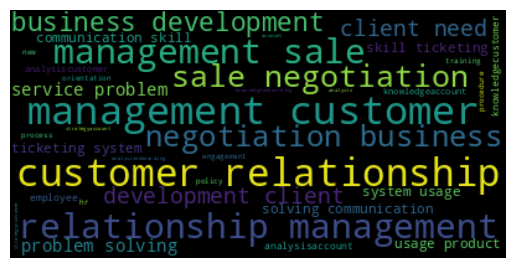


*** Customer Support Specialist ***



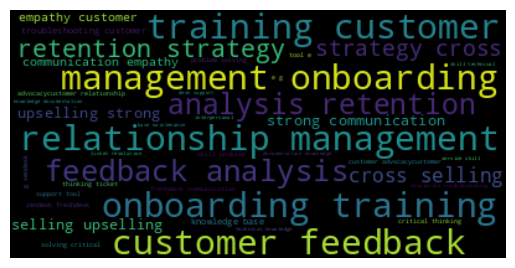


*** Data Analyst ***



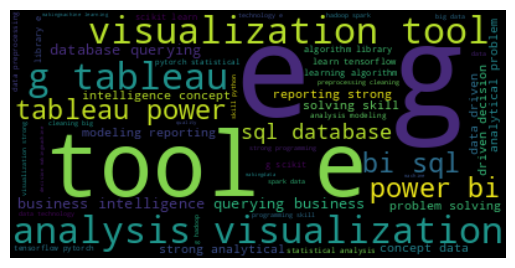


*** Data Engineer ***



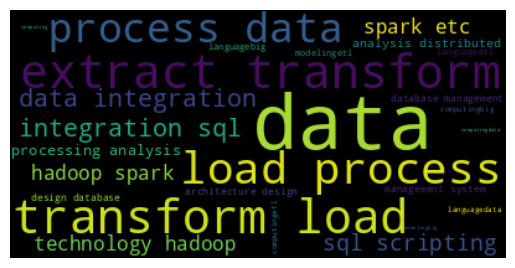


*** Data Entry Clerk ***



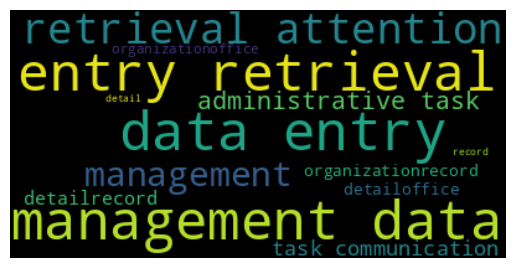


*** Data Scientist ***



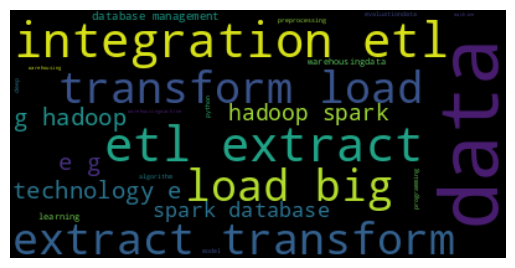


*** Database Administrator ***



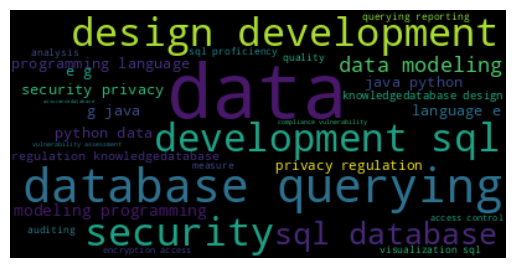


*** Database Developer ***



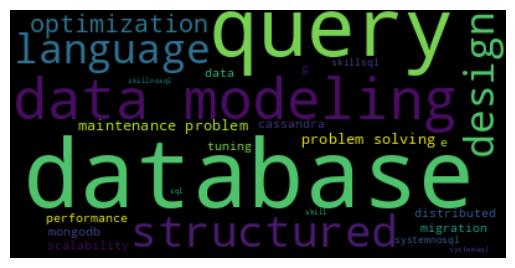


*** Dental Hygienist ***



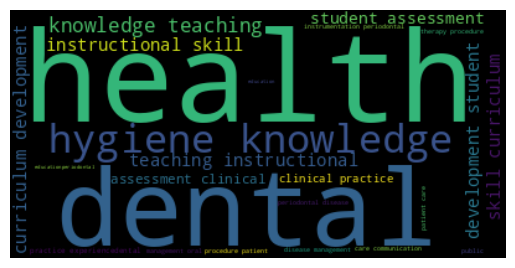


*** Digital Marketing Specialist ***



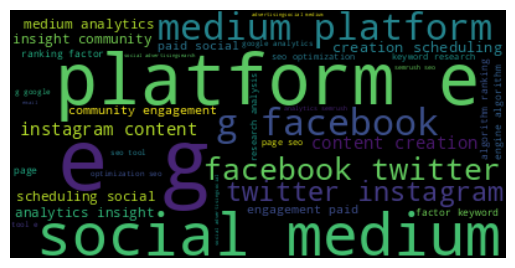


*** Electrical Designer ***



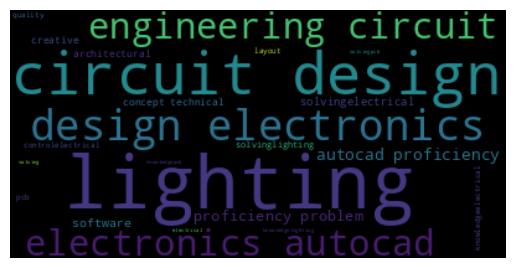


*** Electrical Engineer ***



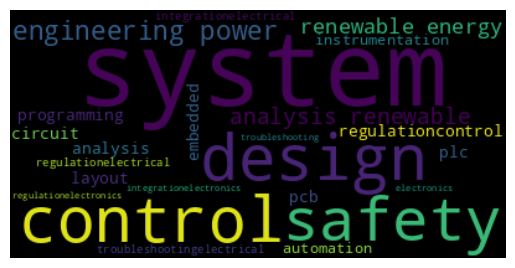


*** Email Marketing Specialist ***



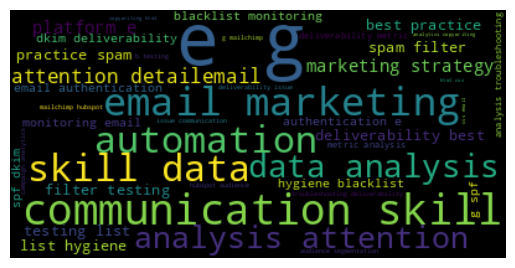


*** Environmental Consultant ***



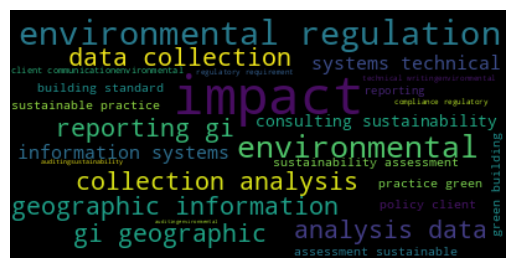


*** Environmental Engineer ***



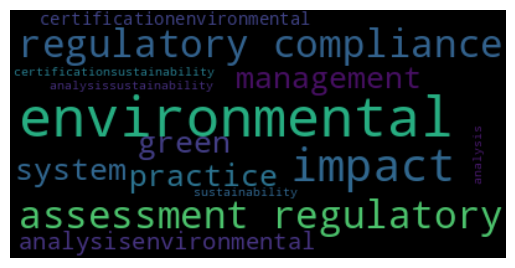


*** Event Coordinator ***



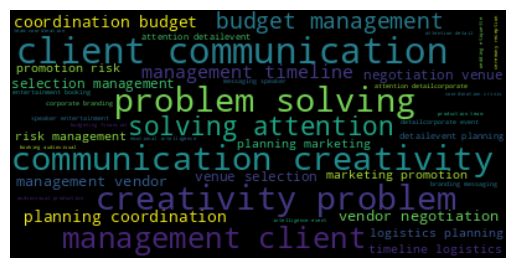


*** Event Manager ***



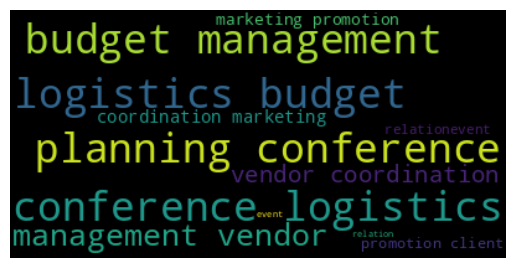


*** Event Planner ***



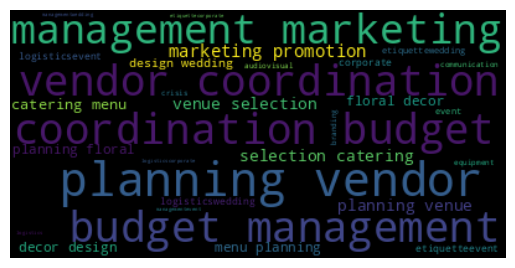


*** Executive Assistant ***



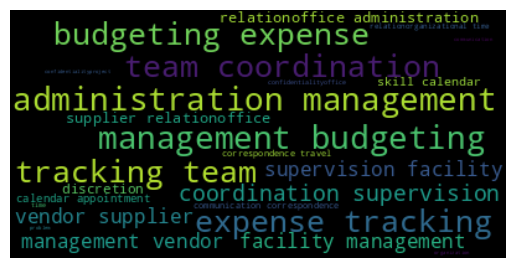


*** Family Lawyer ***



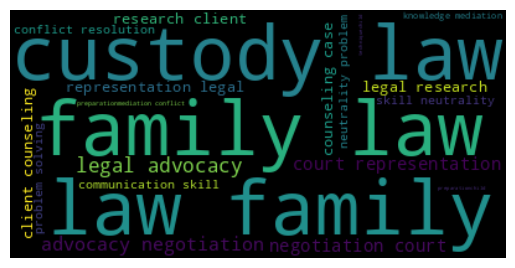


*** Family Nurse Practitioner ***



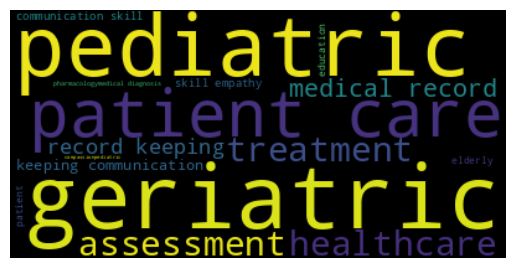


*** Finance Manager ***



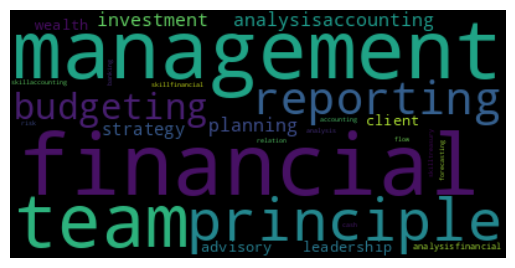


*** Financial Advisor ***



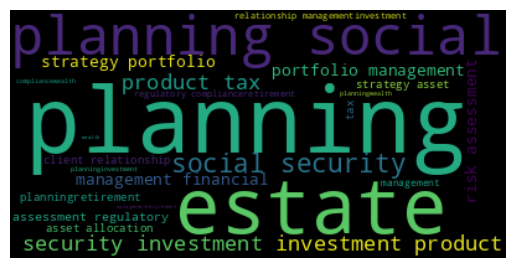


*** Financial Analyst ***



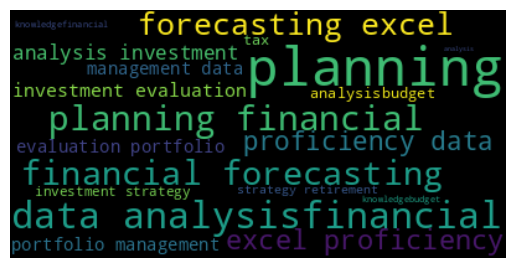


*** Financial Controller ***



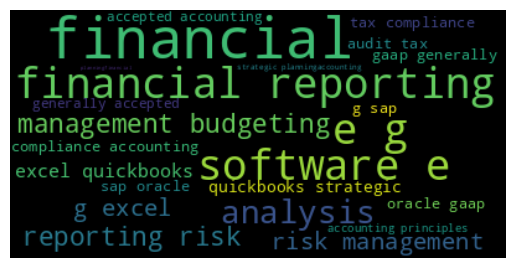


*** Financial Planner ***



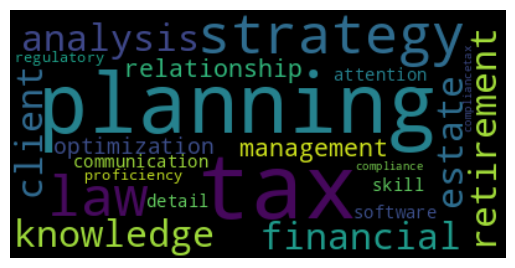


*** Front-End Developer ***



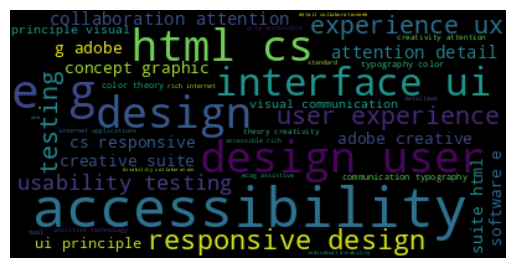


*** Front-End Engineer ***



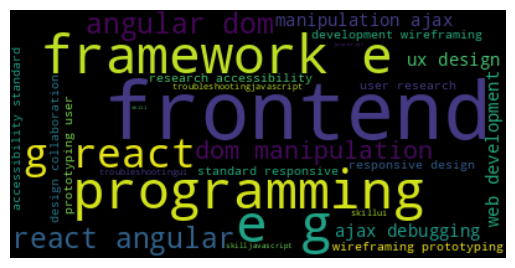


*** Graphic Designer ***



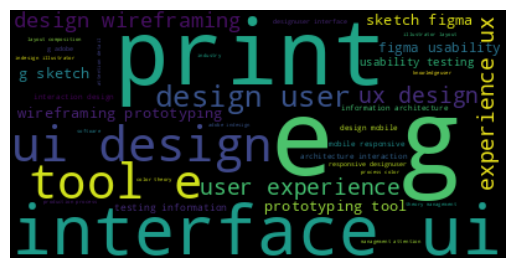


*** HR Coordinator ***



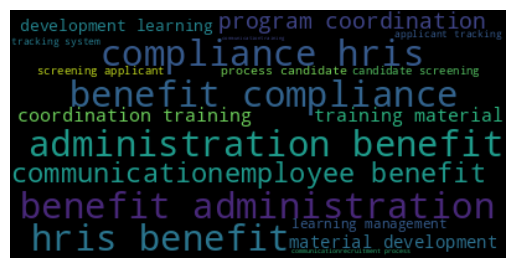


*** HR Generalist ***



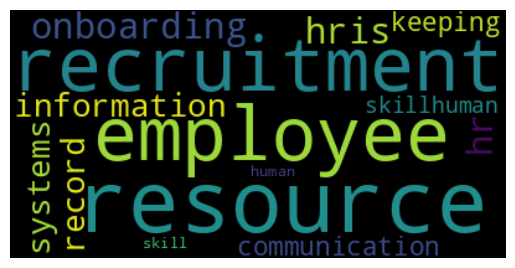


*** HR Manager ***



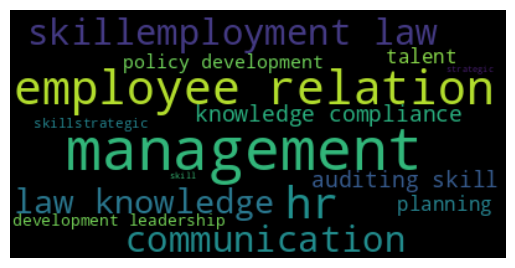


*** Human Resources Manager ***



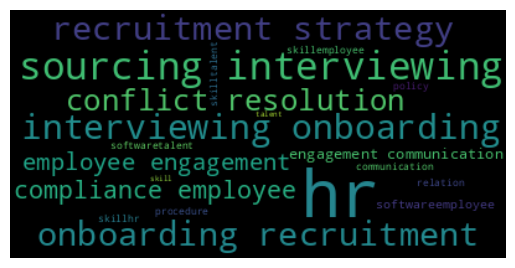


*** IT Administrator ***



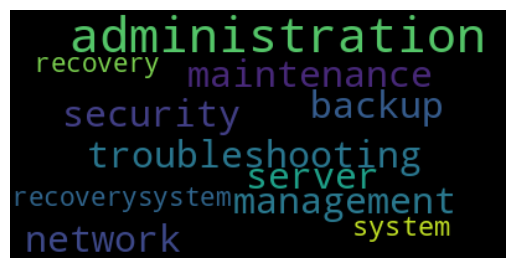


*** IT Manager ***



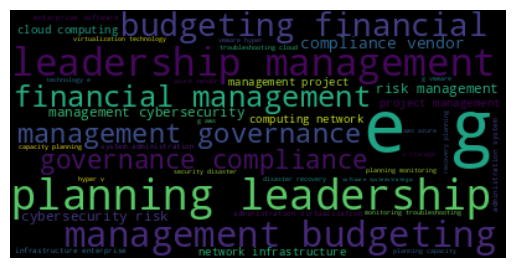


*** IT Support Specialist ***



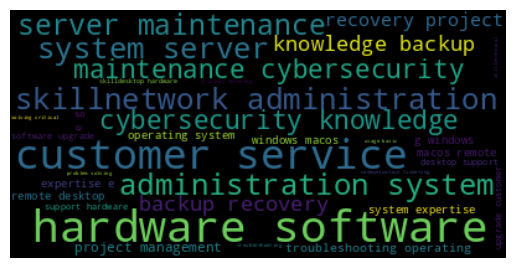


*** Interior Designer ***



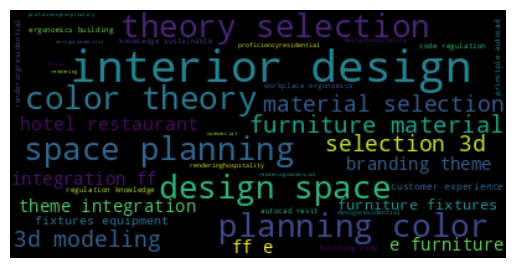


*** Inventory Analyst ***



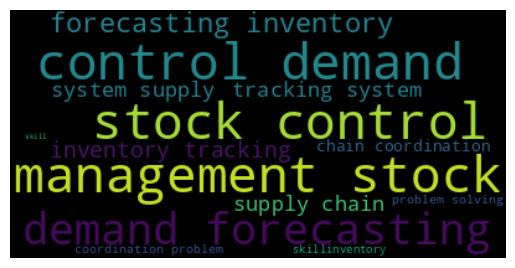


*** Investment Advisor ***



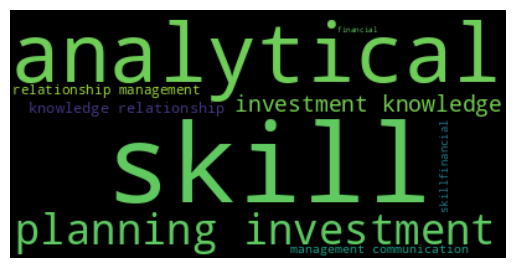


*** Investment Analyst ***



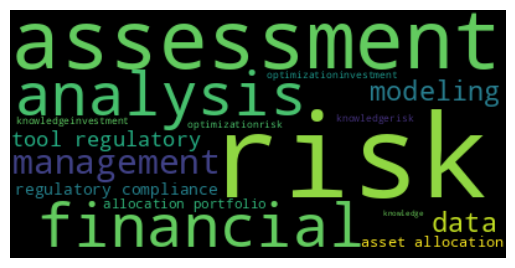


*** Investment Banker ***



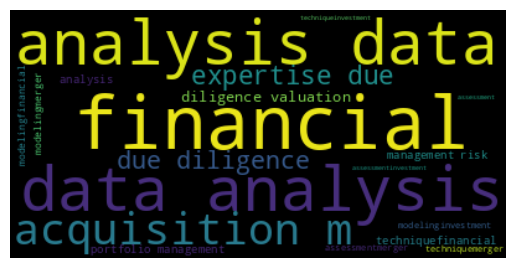


*** Java Developer ***



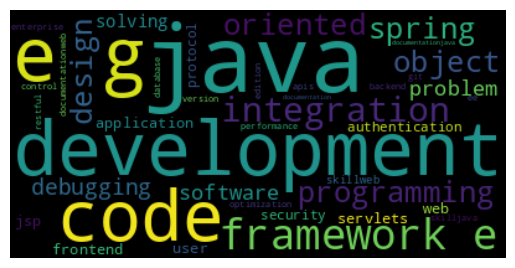


*** Key Account Manager ***



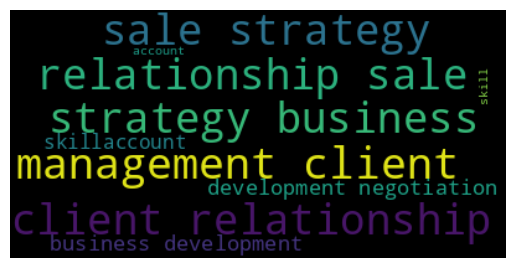


*** Landscape Architect ***



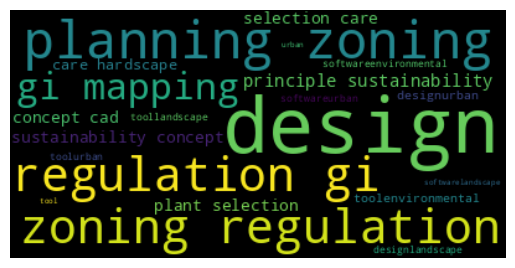


*** Landscape Designer ***



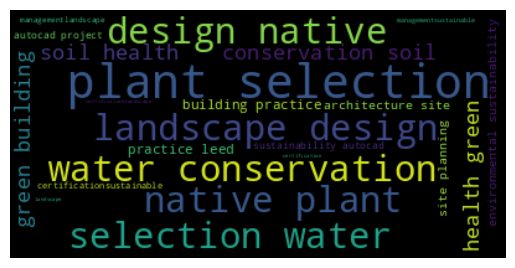


*** Legal Advisor ***



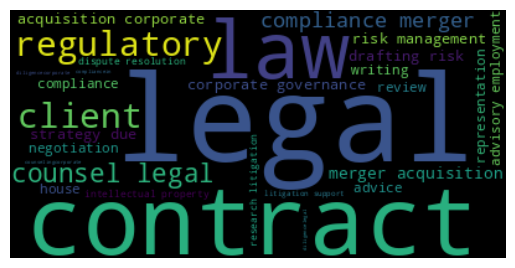


*** Legal Assistant ***



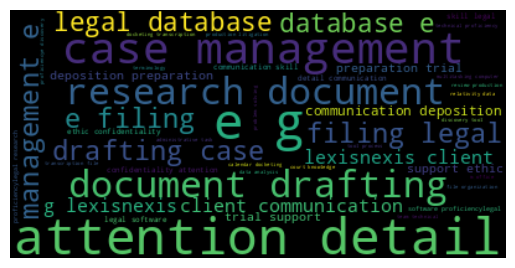


*** Legal Counsel ***



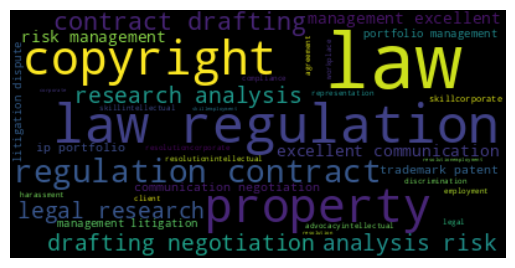


*** Legal Secretary ***



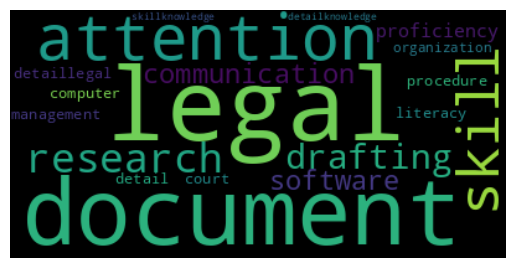


*** Litigation Attorney ***



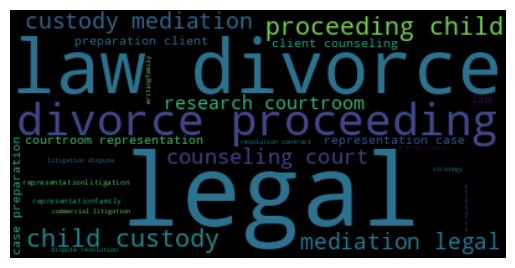


*** Market Analyst ***



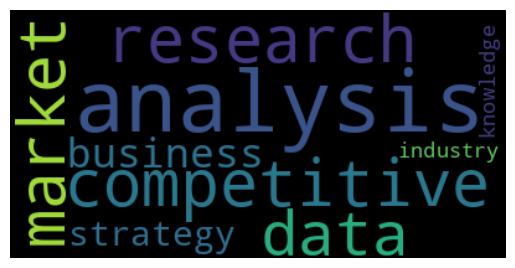


*** Market Research Analyst ***



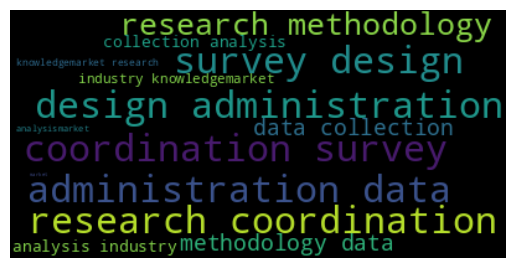


*** Marketing Analyst ***



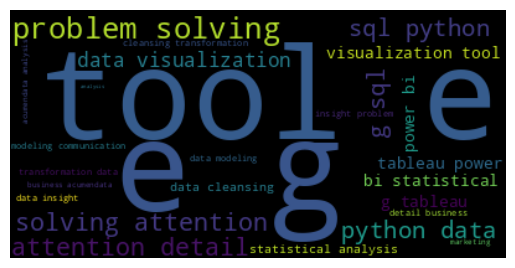


*** Marketing Coordinator ***



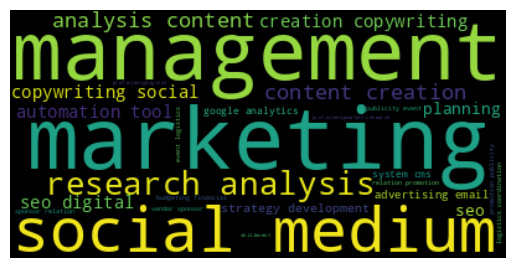


*** Marketing Director ***



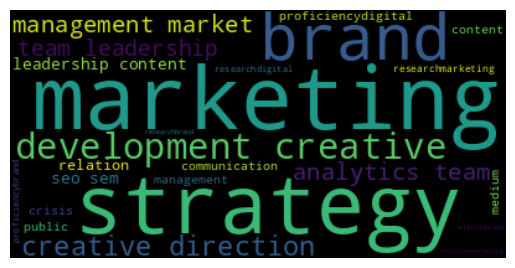


*** Marketing Manager ***



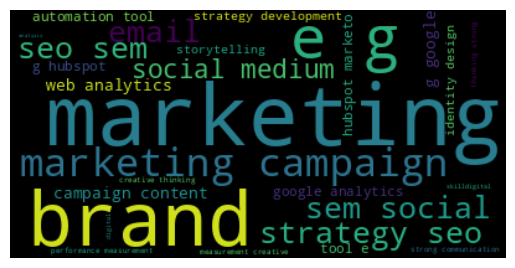


*** Marketing Specialist ***



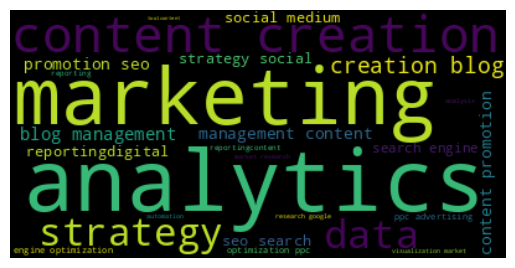


*** Mechanical Designer ***



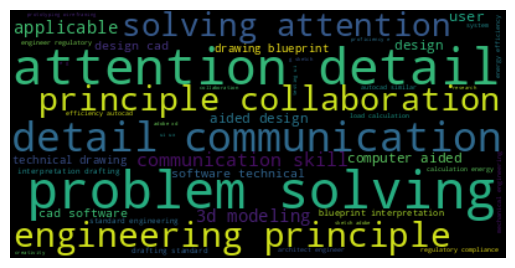


*** Mechanical Engineer ***



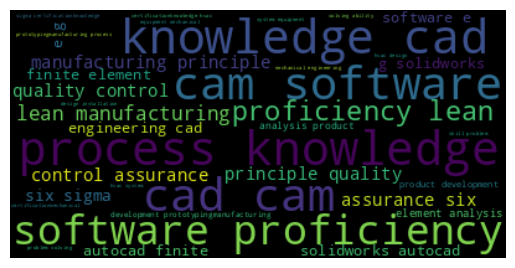


*** Network Administrator ***



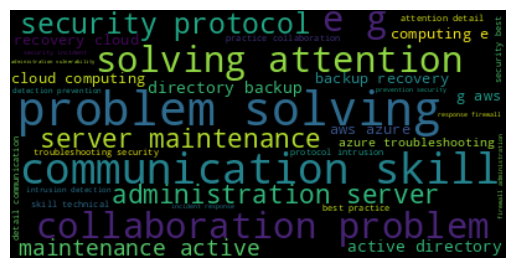


*** Network Analyst ***



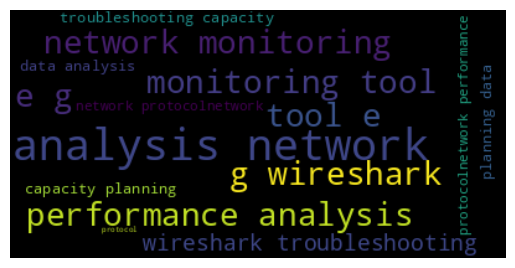


*** Network Engineer ***



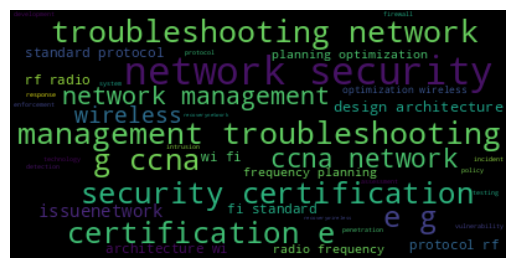


*** Network Security Specialist ***



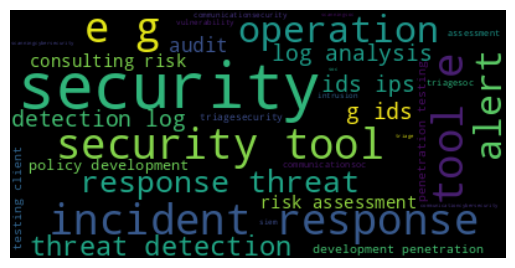


*** Network Technician ***



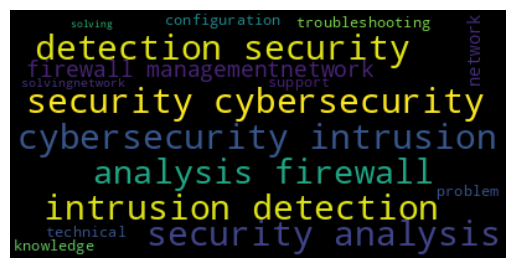


*** Nurse Manager ***



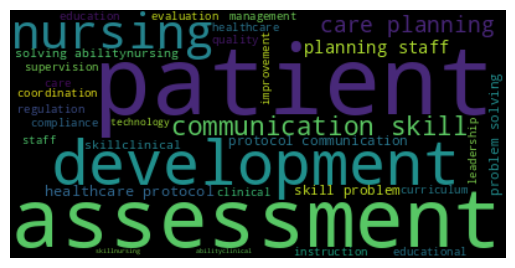


*** Nurse Practitioner ***



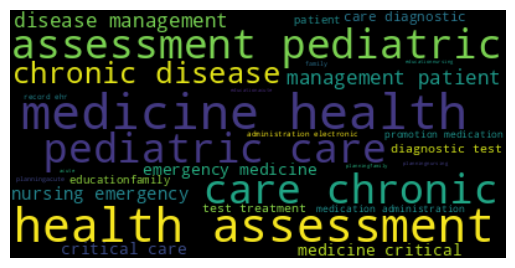


*** Occupational Therapist ***



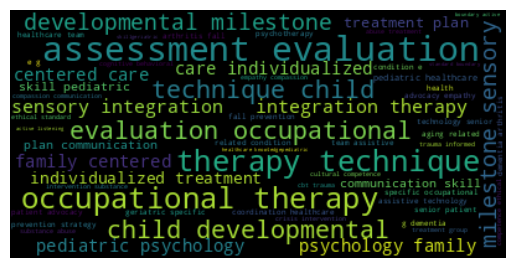


*** Office Manager ***



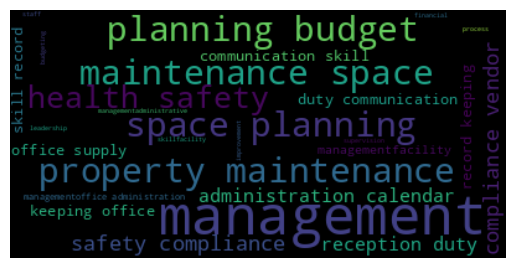


*** Operations Manager ***



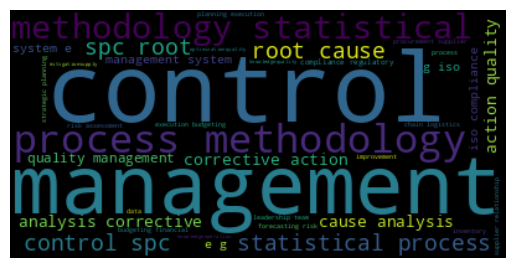


*** Paralegal ***



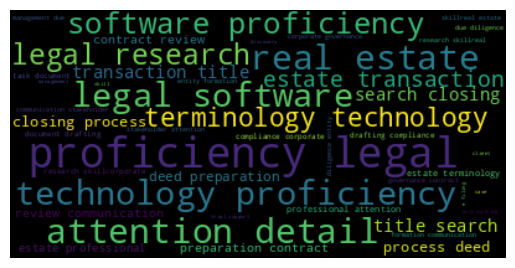


*** Pediatrician ***



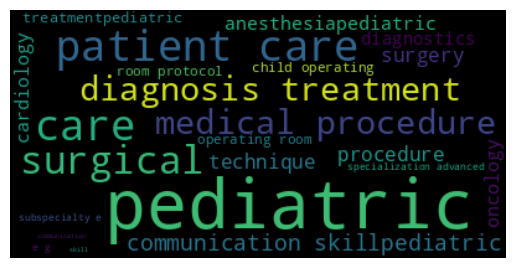


*** Personal Assistant ***



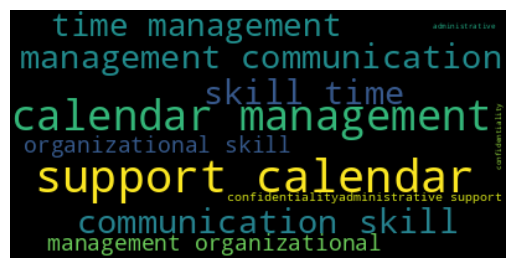


*** Pharmaceutical Sales Representative ***



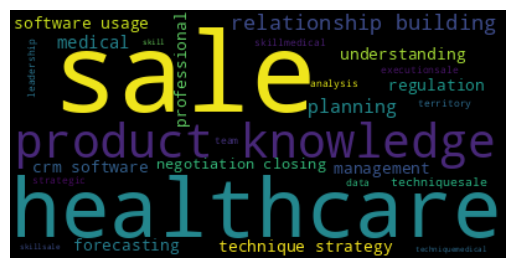


*** Physical Therapist ***



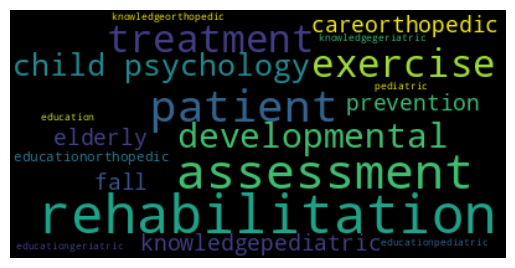


*** Physician Assistant ***



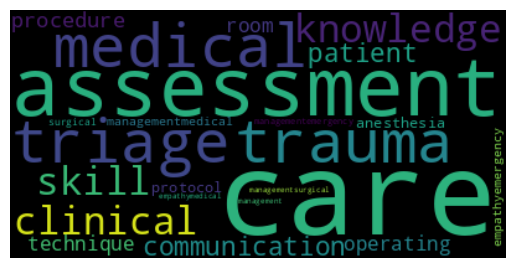


*** Process Engineer ***



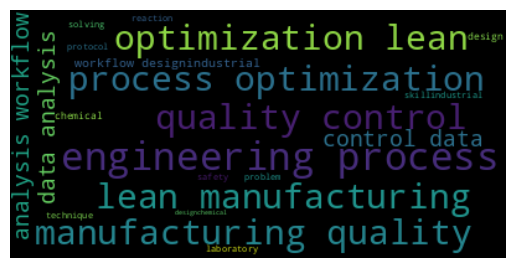


*** Procurement Coordinator ***



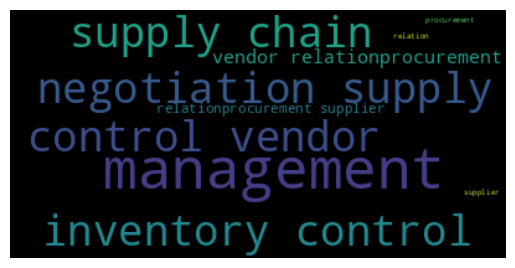


*** Procurement Manager ***



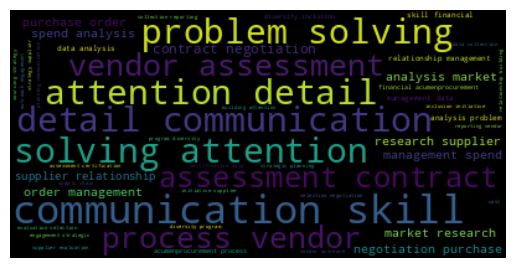


*** Procurement Specialist ***



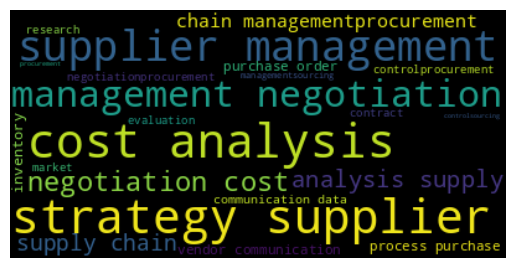


*** Product Designer ***



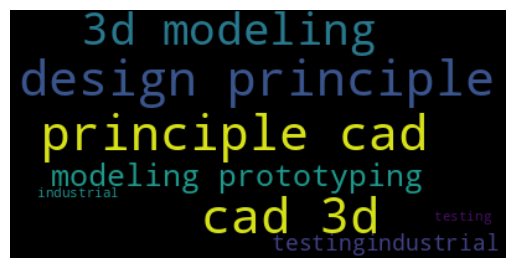


*** Product Manager ***



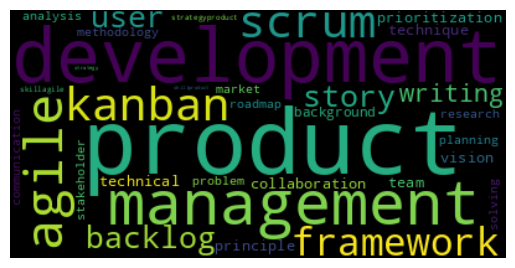


*** Project Coordinator ***



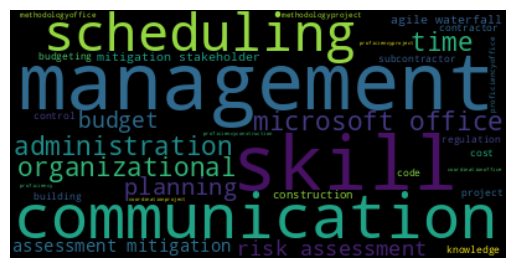


*** Project Manager ***



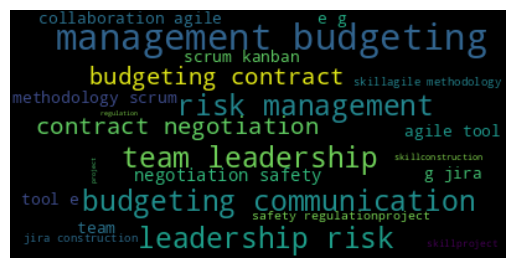


*** Psychologist ***



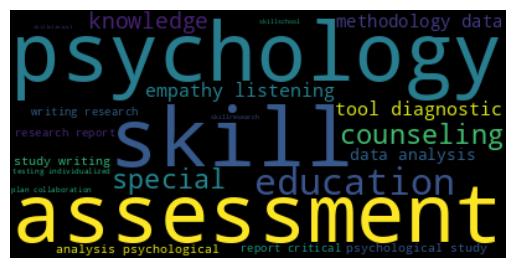


*** Public Relations Specialist ***



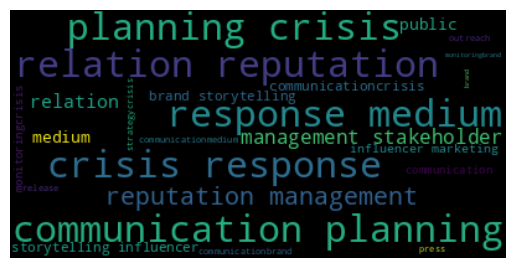


*** Purchasing Agent ***



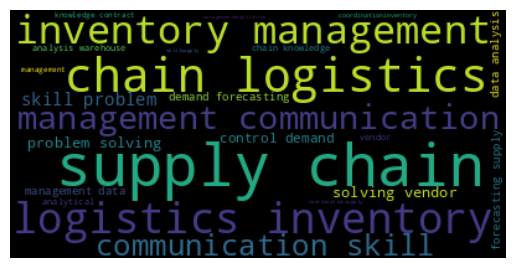


*** QA Analyst ***



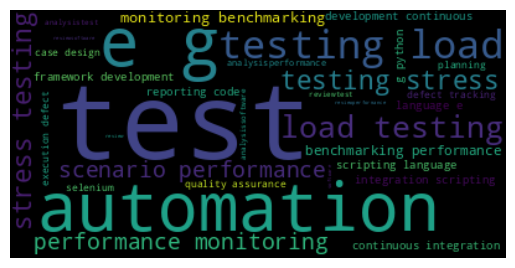


*** QA Engineer ***



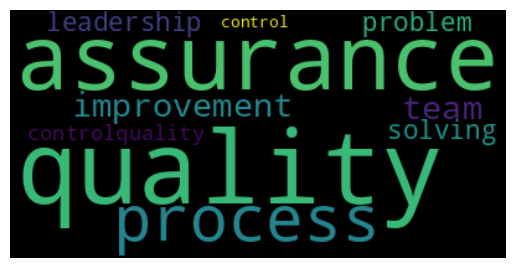


*** Quality Assurance Analyst ***



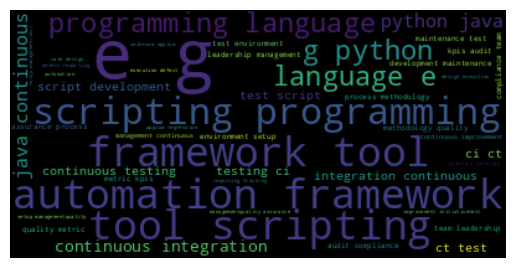


*** Registered Nurse ***



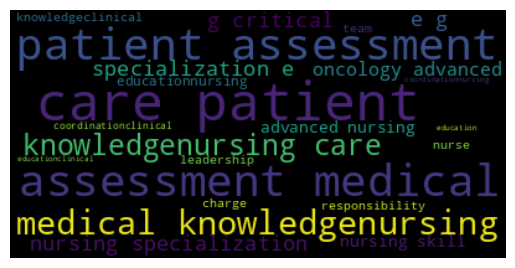


*** Research Analyst ***



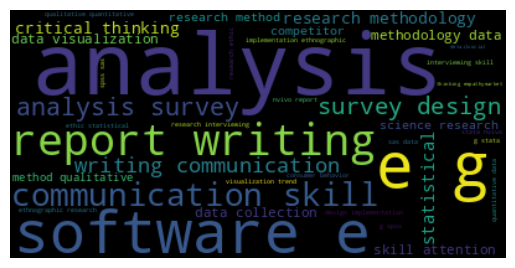


*** Research Scientist ***



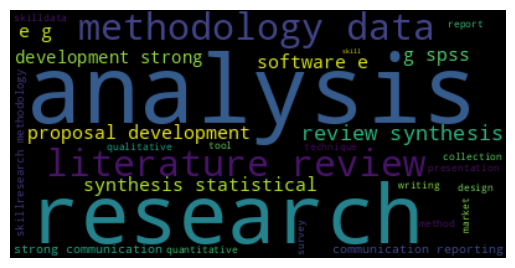


*** SEM Specialist ***



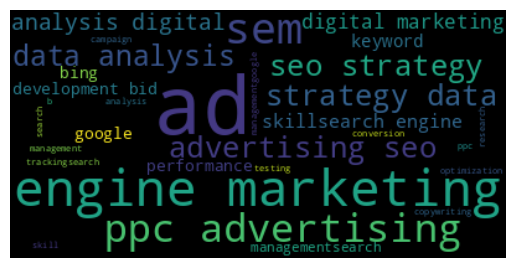


*** SEO Analyst ***



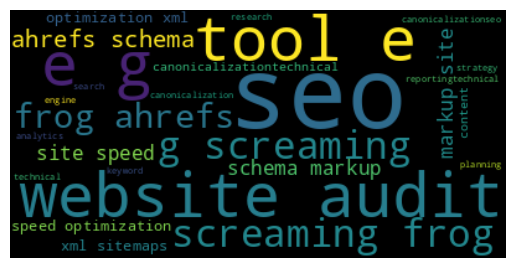


*** SEO Specialist ***



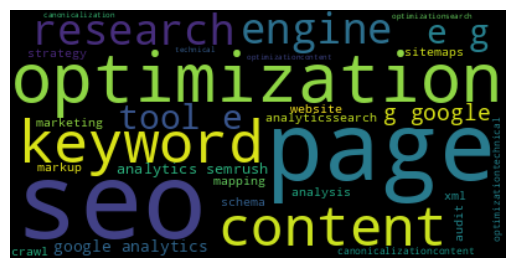


*** Sales Associate ***



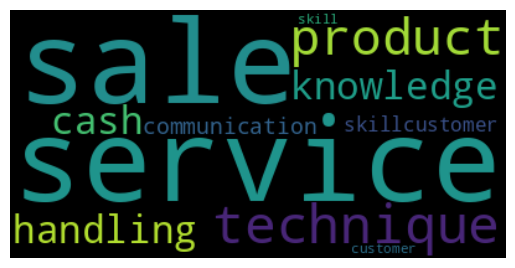


*** Sales Consultant ***



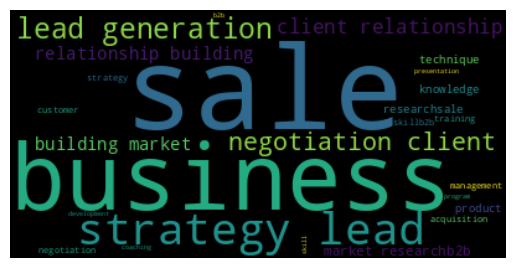


*** Sales Manager ***



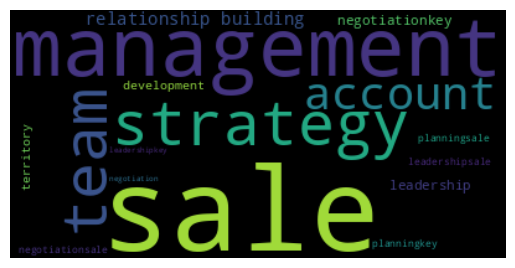


*** Sales Representative ***



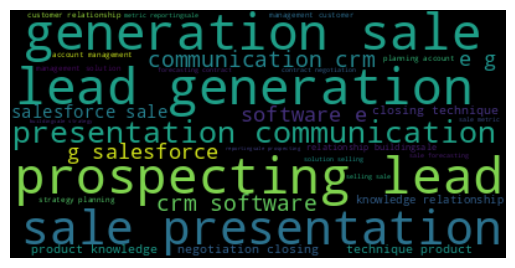


*** Social Media Coordinator ***



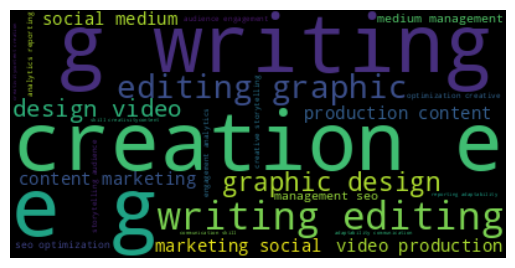


*** Social Media Manager ***



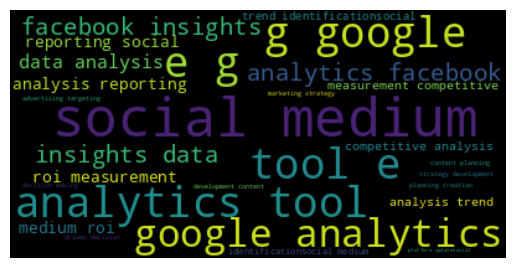


*** Social Worker ***



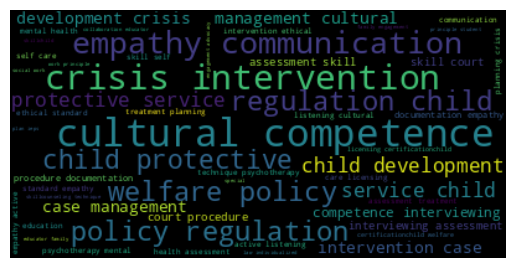


*** Software Architect ***



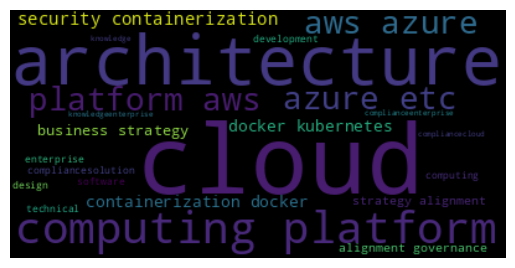


*** Software Developer ***



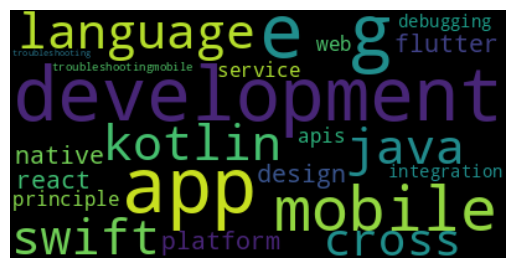


*** Software Engineer ***



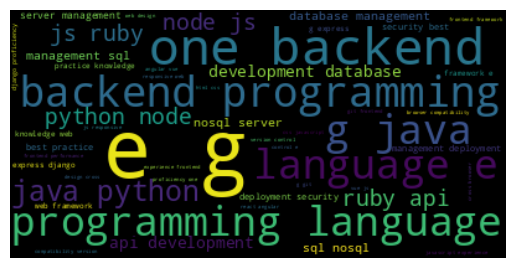


*** Software Tester ***



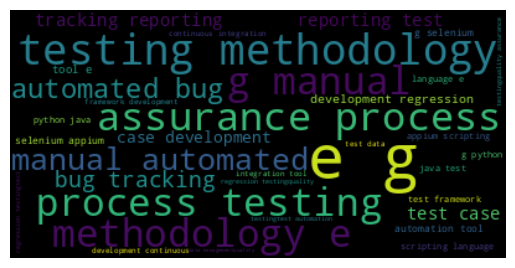


*** Speech Therapist ***



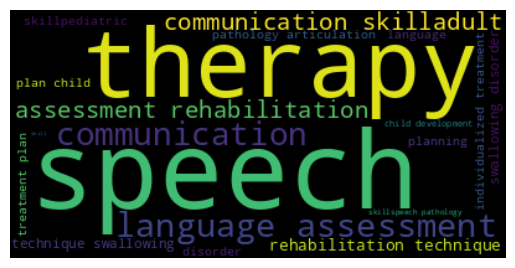


*** Structural Engineer ***



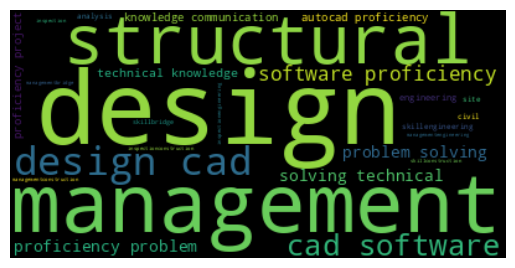


*** Substance Abuse Counselor ***



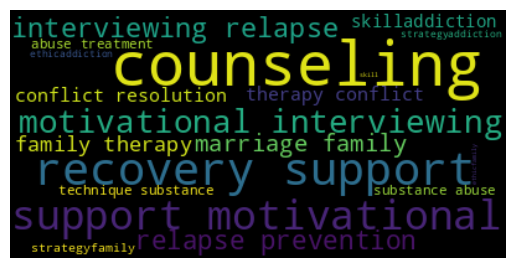


*** Supply Chain Analyst ***



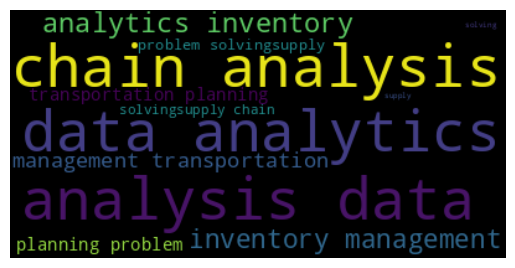


*** Supply Chain Manager ***



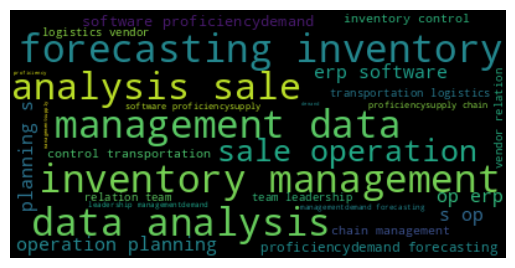


*** Systems Administrator ***



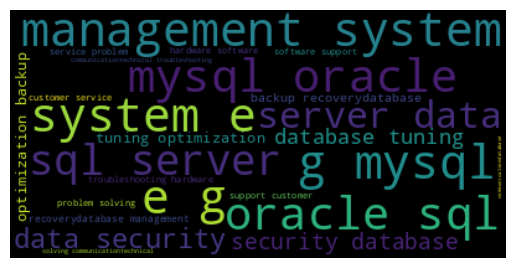


*** Systems Analyst ***



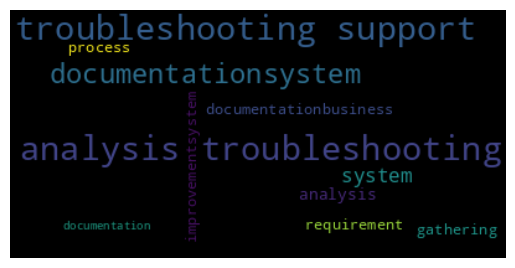


*** Systems Engineer ***



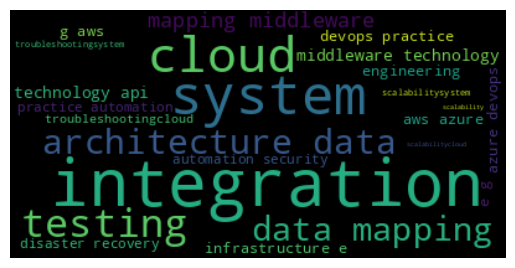


*** Tax Consultant ***



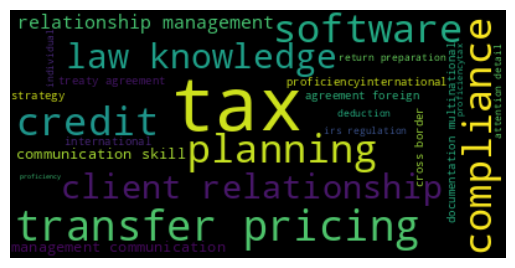


*** Teacher ***



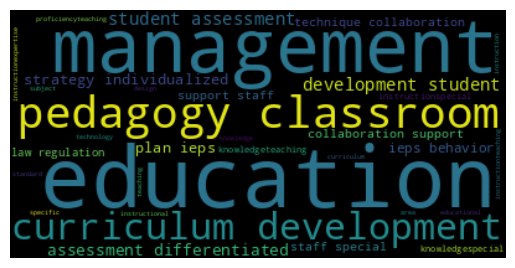


*** Technical Writer ***



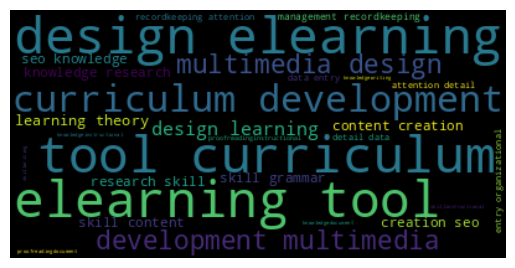


*** UI Developer ***



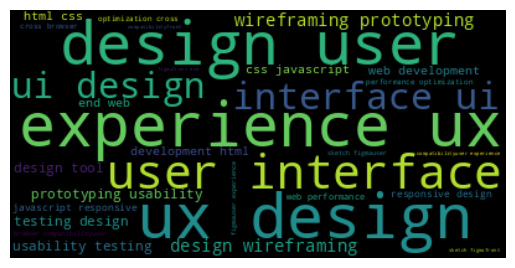


*** UX Researcher ***



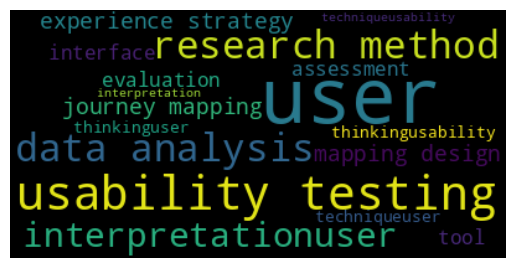


*** UX/UI Designer ***



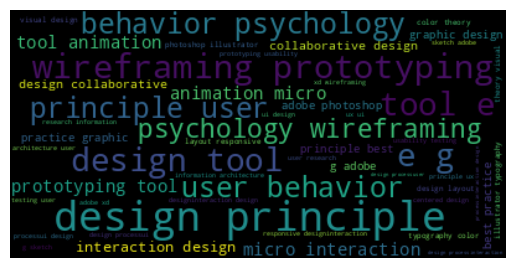


*** Urban Planner ***



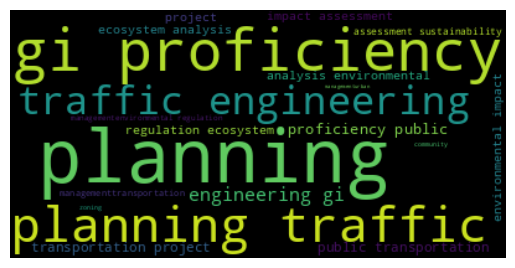


*** Veterinarian ***



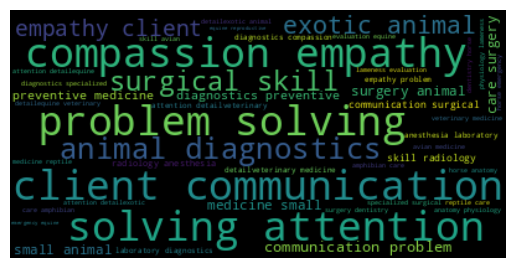


*** Web Designer ***



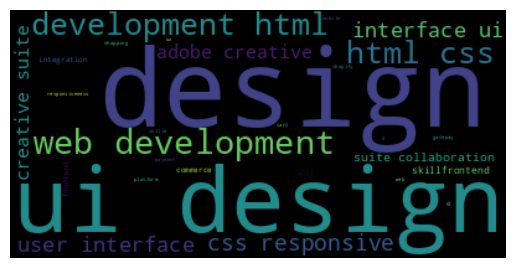


*** Web Developer ***



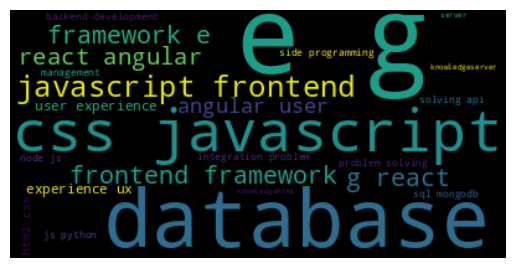


*** Wedding Planner ***



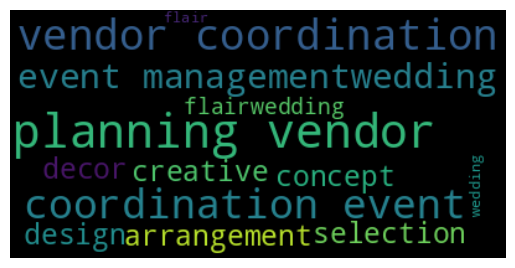

In [ ]:
## Visualize data
jobs_list = jda.Job_Title.unique().tolist()
for job in jobs_list:

    # Start with one review:
    text = jda[jda.Job_Title == job].iloc[0].skills
    # Create and generate a word cloud image:
    wordcloud = WordCloud().generate(text)
    print("\n***",job,"***\n")
    # Display the generated image:
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

In [ ]:
## Delete more stop words
other_stop_words = ['junior', 'senior','experience','etc','job','work','company','technique',
                    'candidate','skill','skills','language','menu','inc','new','plus','years',
                   'technology','organization','ceo','cto','account','manager','data','scientist','mobile',
                    'developer','product','revenue','strong','ass']

test['skills'] = test['skills'].apply(lambda x: " ".join(x for x in x.split() if x not in other_stop_words))

In [ ]:
## Converting text to features
vectorizer = TfidfVectorizer()
#Tokenize and build vocabulary
X = vectorizer.fit_transform(test.skills)
y = test.Job_Title

# split data into 80% training and 20% test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=109)
print("train data shape: ",X_train.shape)
print("test data shape: ",X_test.shape)

# Fit model
clf = MultinomialNB()
clf.fit(X_train, y_train)
## Predict
y_predicted = clf.predict(X_test)

train data shape:  (1636, 970)
test data shape:  (409, 970)


In [ ]:
fig = plt.figure(figsize=(300, 10), dpi=200, facecolor='w', edgecolor='k')

y_train.hist()
y_test.hist()

<Axes: >

In [ ]:
#evaluate the predictions
print("Accuracy score is: ",accuracy_score(y_test, y_predicted))
print("Classes: (to help read Confusion Matrix)\n", clf.classes_)
print("Confusion Matrix: ")

print(confusion_matrix(y_test, y_predicted))
print("Classification Report: ")
print(classification_report(y_test, y_predicted))

Accuracy score is:  0.6356968215158925
Classes: (to help read Confusion Matrix)
 ['Account Director' 'Account Executive' 'Account Manager' 'Accountant'
 'Administrative Assistant' 'Aerospace Engineer' 'Architect'
 'Architectural Designer' 'Art Director' 'Art Teacher'
 'Back-End Developer' 'Brand Ambassador' 'Brand Manager'
 'Business Analyst' 'Business Development Manager' 'Chemical Analyst'
 'Chemical Engineer' 'Civil Engineer' 'Content Writer' 'Copywriter'
 'Customer Service Manager' 'Customer Service Representative'
 'Customer Success Manager' 'Customer Support Specialist' 'Data Analyst'
 'Data Engineer' 'Data Entry Clerk' 'Data Scientist'
 'Database Administrator' 'Database Developer' 'Dental Hygienist'
 'Digital Marketing Specialist' 'Electrical Designer'
 'Electrical Engineer' 'Email Marketing Specialist'
 'Environmental Consultant' 'Environmental Engineer' 'Event Coordinator'
 'Event Manager' 'Event Planner' 'Executive Assistant' 'Family Lawyer'
 'Family Nurse Practitioner' 'Fin

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

Our accuracy score is 64% which is acceptable.

NOTE: Model accuracy dropped down after deleting the job titles from their respective descriptions. Which is expectable. ( If most job descriptions for CEO contain the word CEO, then the token CEO will be the most important feature for the class CEO)

This way our model will give more weight to other remaining/meaningful tokens

The confusion matrix shows that the features for the account manager, data scientist and mobile developer are differenciable. Therefore, we expect to extract meaningful features out of these classes.

In [ ]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
import nltk
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


True

In [ ]:
from textblob import TextBlob
import pandas as pd

technical_skills = ['python', 'c', 'r', 'c++', 'java', 'hadoop', 'scala', 'flask', 'pandas', 'spark', 'scikit-learn',
                    'numpy', 'php', 'sql', 'mysql', 'css', 'mongdb', 'nltk', 'fastai', 'keras', 'pytorch', 'tensorflow',
                    'linux', 'Ruby', 'javascript', 'django', 'react', 'reactjs', 'ai', 'ui', 'tableau','angular']

feature_array = vectorizer.get_feature_names_out()

# Number of overall model features
features_numbers = len(feature_array)
## Max sorted features number
n_max = int(features_numbers * 0.1)

## Initialize output dataframe
output_data = []

for i in range(0, len(clf.classes_)):
    print("\n****", clf.classes_[i], "****\n")
    class_prob_indices_sorted = clf.feature_log_prob_[i, :].argsort()[::-1]
    raw_skills = np.take(feature_array, class_prob_indices_sorted[:n_max])
    print("List of unprocessed skills:")
    print(raw_skills)

    ## Extract technical skills
    top_technical_skills = list(set(technical_skills).intersection(raw_skills))[:6]

    # Transform list to string
    txt = " ".join(raw_skills)
    blob = TextBlob(txt)
    # Top 6 adjectives
    top_adjectives = [w for (w, pos) in TextBlob(txt).pos_tags if pos.startswith("JJ")][:6]

    # Append data to the list of dictionaries
    output_data.append({'Job_Title': clf.classes_[i],
                        'technical_skills': top_technical_skills,
                        'soft_skills': top_adjectives})

# Create a DataFrame from the list of dictionaries
output = pd.DataFrame(output_data)

# Display the resulting DataFrame
print(output)



**** Account Director ****

List of unprocessed skills:
['client' 'acquisition' 'presentation' 'strategy' 'strategic' 'business'
 'analysis' 'leadership' 'market' 'team' 'sale' 'campaign' 'relation'
 'development' 'planning' 'optimization' 'marketing' 'communication'
 'management' 'enforcement' 'enterprise' 'engineering' 'engineer' 'engine'
 'engagement' 'empathy' 'energy' 'end' 'encryption' 'emr' 'employment'
 'employee' 'emotional' 'emergency' 'embedded' 'email' 'entertainment'
 'environmental' 'entity' 'entry' 'expertise' 'experimentation'
 'experimental' 'expense' 'expansion' 'exotic' 'exhibition' 'exercise'
 'execution' 'excellent' 'excel' 'event' 'evaluation' 'etl' 'etiquette'
 'ethnographic' 'ethical' 'ethic' 'etc' 'estate' 'erp' 'ergonomics'
 'equipment' 'equine' 'epidemiology' 'electronics' 'environment' 'element'
 'electrical' 'electronic' 'disorder' 'discrimination' 'discretion'
 'discovery' 'disaster' 'disability' 'directory' 'direction' 'diligence'
 'digital' 'differentia

In [ ]:
print(output.T)

                                                                0    \
Job_Title                                          Account Director   
technical_skills                                                 []   
soft_skills       [strategic, emotional, environmental, experime...   

                                                                1    \
Job_Title                                         Account Executive   
technical_skills                                                 []   
soft_skills       [tactic, key, end, emotional, empathy, experim...   

                                                                2    \
Job_Title                                           Account Manager   
technical_skills                                                 []   
soft_skills       [engagement, emr, empathy, emotional, email, e...   

                                                                3    \
Job_Title                                                Accountant   
tec

In [ ]:
import pandas as pd

# Load the job dataset
csv_data = pd.read_csv('/content/drive/MyDrive/AAI/train.csv')

# Function to recommend job titles based on user's skills
def recommend_job_titles(skills):
    # Extract unique job titles
    job_titles = csv_data["Job_Title"].unique()

    # Find job titles with matching skills in the job description
    matched_titles = []
    for title in job_titles:
        # Get job description for the current title
        job_description = csv_data[csv_data["Job_Title"] == title]["skills"].iloc[0]
        # Check if any of the user's skills match with the job description
        if any(skill.lower() in job_description.lower() for skill in skills):
            matched_titles.append(title)

    return matched_titles

# Function to generate a sample resume based on the selected job title
def generate_resume(job_title, skills):
    resume = {
        "Personal Information": {
        "Name": "ABC XYZ",
        "Contact Information": {
        "Email": "abs.xyz@example.com",
        "Phone": "123-456-7890",
        "LinkedIn": "linkedin.com/in/abc_xyz",
            },
        },
        "Skills": skills,
        "Job Title": job_title,
        "Job Description": None,
        "Responsibilities": None,
        "Benefits": None,
        "Company Profile": None,
    }

    # Fetch job-related details from the dataset
    job_data = csv_data[csv_data["Job_Title"] == job_title]
    if not job_data.empty:
        resume["Job Description"] = job_data["Job_Description"].iloc[0]
        resume["Responsibilities"] = job_data["Responsibilities"].iloc[0]
        resume["Benefits"] = job_data["Benefits"].iloc[0]
        resume["Company Profile"] = job_data["Company Profile"].iloc[0]

    return resume


# User input for skills
user_skills = ["css"]  # Example input of skills the user is good at

# Recommend job titles based on the user's skills
recommended_titles = recommend_job_titles(user_skills)

# Display recommended job titles and allow user to choose one
print("Recommended job titles:")
for idx, title in enumerate(recommended_titles):
    print(f"{idx + 1}. {title}")



Recommended job titles:
1. Web Developer
2. UI Developer
3. Front-End Developer
4. Web Designer


In [ ]:
# User selects one of the recommended job titles
selected_idx = int(input())  # Example: User chooses the first recommended title
selected_job_title = recommended_titles[selected_idx - 1]  # Convert index to title

# Generate a resume for the selected job title
sample_resume = generate_resume(selected_job_title, user_skills)

# Display the generated sample resume
print("\nSample Resume:")
for key, value in sample_resume.items():
    if isinstance(value, dict):
        print(f"{key}:")
        for sub_key, sub_value in value.items():
            print(f"  {sub_key}: {sub_value}")
    else:
        print(f"{key}: {value}")


3

Sample Resume:
Personal Information:
  Name: ABC XYZ
  Contact Information: {'Email': 'abs.xyz@example.com', 'Phone': '123-456-7890', 'LinkedIn': 'linkedin.com/in/abc_xyz'}
Skills: ['css']
Job Title: Front-End Developer
Job Description: An Accessibility Developer focuses on making digital products and websites accessible to individuals with disabilities, ensuring compliance with accessibility standards.
Responsibilities: Ensure web accessibility for all users, including those with disabilities. Implement WCAG guidelines and accessibility features. Conduct accessibility testing and remediation.
Benefits: {'Employee Referral Programs, Financial Counseling, Health and Wellness Facilities, Casual Dress Code, Flexible Spending Accounts (FSAs)'}
Company Profile: {"Sector":"Elevators & Escalators","Industry":"Industrial Machinery","City":"Farmington","State":"Connecticut","Zip":"6032","Website":"www.otis.com","Ticker":"OTIS","CEO":"Judith F. Marks"}


In [ ]:
import pandas as pd

word = 'css'

# Count how many rows contain the specific word
rows_with_word = test['skills'].str.contains(word, case=False).sum()

print(f"The word '{word}' appears in {rows_with_word} rows.")


The word 'css' appears in 44 rows.


In [ ]:
import pandas as pd
from collections import Counter

# Load the dataset
df = pd.read_csv('/content/drive/MyDrive/AAI/train.csv')  # Change this to the path where your CSV file is located

# Simplified text processing: convert to lowercase, remove punctuation and digits
df['skills'] = df['skills'].str.lower()
df['skills'] = df['skills'].str.replace('[^\w\s]', ' ', regex=True)
df['skills'] = df['skills'].str.replace('\d+', '', regex=True)

# Function to extract keywords (the most frequent words) from skills
def extract_keywords(text):
    words = text.split()  # Just split the text into words without removing stopwords
    word_freq = Counter(words)
    # Get the 10 most common words as a simple 'word cloud'
    return ', '.join([word for word, freq in word_freq.most_common(10)])

# Apply keyword extraction to each job title group and get the top keywords
df['word_cloud'] = df['skills'].apply(extract_keywords)

# Save the DataFrame to a CSV file
df[['Job_Title', 'word_cloud']].to_csv('submission.csv', index=False)

print("The CSV file has been created with the job titles and the corresponding 'word clouds'.")


The CSV file has been created with the job titles and the corresponding 'word clouds'.


In [ ]:
import pandas as pd
from collections import Counter
from IPython.display import FileLink

# Load the dataset
df = pd.read_csv('/content/drive/MyDrive/AAI/train.csv')  # Adjust this to your CSV file's location

# Simplified text processing: convert to lowercase, remove punctuation and digits
df['skills'] = df['skills'].str.lower()
df['skills'] = df['skills'].str.replace('[^\w\s]', ' ', regex=True)
df['skills'] = df['skills'].str.replace('\d+', '', regex=True)

# Function to extract keywords (the most frequent words) from skills
def extract_keywords(text):
    words = text.split()  # Just split the text into words without removing stopwords
    word_freq = Counter(words)
    # Get the 10 most common words as a simple 'word cloud'
    return ', '.join([word for word, freq in word_freq.most_common(10)])

# Apply keyword extraction to each job title group and get the top keywords
df['word_cloud'] = df['skills'].apply(extract_keywords)

# Save the DataFrame to a CSV file
output_file = 'submission.csv'
df[['Job_Title', 'word_cloud']].to_csv(output_file, index=False)

# Display the DataFrame in the notebook
display(df[['Job_Title', 'word_cloud']])

,Job_Title,word_cloud
0,Digital Marketing Specialist,"social, media, and, platforms, e, g, facebook,..."
1,Web Developer,"html, css, javascript, frontend, frameworks, e..."
2,Operations Manager,"and, quality, control, processes, methodologie..."
3,Network Engineer,"wireless, and, network, protocols, design, arc..."
4,Event Manager,"event, planning, conference, logistics, budget..."
...,...,...
2045,Finance Manager,"financial, planning, investment, strategies, t..."
2046,Finance Manager,"management, treasury, cash, flow, analysis, ri..."
2047,SEO Specialist,"technical, seo, audits, website, crawl, analys..."
2048,Marketing Coordinator,"marketing, digital, strategy, development, soc..."


In [ ]:
import pandas as pd
from collections import Counter

# Load the dataset
df = pd.read_csv('/content/drive/MyDrive/AAI/train.csv')  # Adjust this to your CSV file's location

# Simplified text processing: convert to lowercase, remove punctuation and digits
df['skills'] = df['skills'].str.lower()
df['skills'] = df['skills'].str.replace('[^\w\s]', ' ', regex=True)
df['skills'] = df['skills'].str.replace('\d+', '', regex=True)

# Function to extract keywords (the most frequent words) from skills
def extract_keywords(text):
    words = text.split()  # Just split the text into words without removing stopwords
    word_freq = Counter(words)
    # Get the 10 most common words as a simple 'word cloud'
    return ', '.join([word for word, freq in word_freq.most_common(10)])

# Apply keyword extraction to each job title group and get the top keywords
df['skills'] = df['skills'].apply(extract_keywords)

# Add an 'id' column starting from 0
df.reset_index(drop=True, inplace=True)
df.index.name = 'id'

# Select only the 'id' and 'skills' columns and save to a CSV file
output_file = 'submission.csv'
df[['skills']].to_csv(output_file, index=True, index_label='id')

# Print the final DataFrame structure (optional)
print(df[['skills']])


                                                 skills
id                                                     
0     social, media, and, platforms, e, g, facebook,...
1     html, css, javascript, frontend, frameworks, e...
2     and, quality, control, processes, methodologie...
3     wireless, and, network, protocols, design, arc...
4     event, planning, conference, logistics, budget...
...                                                 ...
2045  financial, planning, investment, strategies, t...
2046  management, treasury, cash, flow, analysis, ri...
2047  technical, seo, audits, website, crawl, analys...
2048  marketing, digital, strategy, development, soc...
2049  and, quality, assurance, processes, methodolog...

[2050 rows x 1 columns]
